In [4]:
import torch
import random
import torchaudio

from IPython.display import Audio

In [28]:
def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None, ylim=None):
    import matplotlib.pyplot as plt
    import torchaudio
    import torchaudio.transforms as T

    plt.figure()
    plt.title(title)
    plt.plot(waveform.t().numpy())
    plt.grid()

    if xlim:
        plt.xlim(xlim)
    if ylim:
        plt.ylim(ylim)

    plt.xlabel("Sample")
    plt.ylabel("Amplitude")
    plt.show()

In [30]:
waveform, sample_rate = torchaudio.load(
    "../data/birdclef-2023/train_audio/abythr1/XC122413.ogg"
)

Audio(waveform, rate=sample_rate)

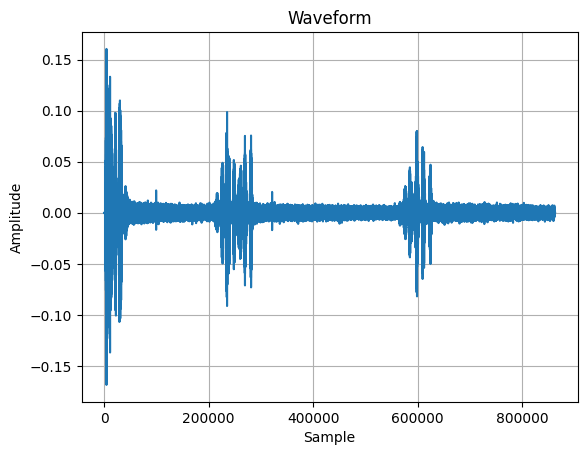

In [31]:
plot_waveform(waveform, sample_rate)

### RandomGain 

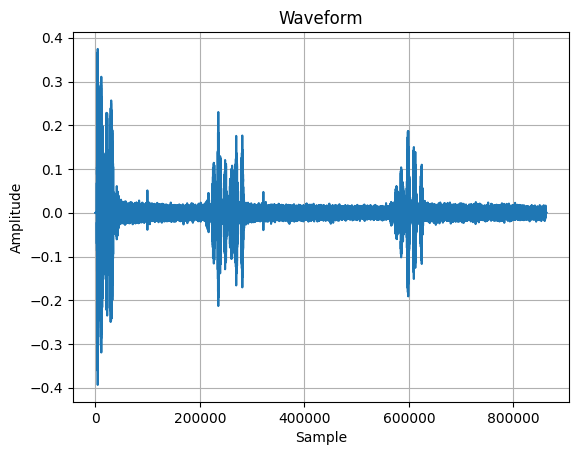

In [82]:
class RandomGain(torch.nn.Module):
    def __init__(
        self, min_gain=-20, max_gain=20, gain_types=["db", "amplitude", "power"]
    ):
        super(RandomGain, self).__init__()
        self.min_gain = min_gain
        self.max_gain = max_gain
        self.gain_types = gain_types

    def forward(self, waveform):
        gain_type = random.choice(self.gain_types)
        if gain_type == "amplitude":
            min_value = torch.exp(
                torch.tensor(self.min_gain / 20) * torch.log(torch.tensor(10.0))
            )
            max_value = torch.exp(
                torch.tensor(self.max_gain / 20) * torch.log(torch.tensor(10.0))
            )
        elif gain_type == "power":
            min_value = torch.exp(
                torch.tensor(self.min_gain / 10) * torch.log(torch.tensor(10.0))
            )
            max_value = torch.exp(
                torch.tensor(self.max_gain / 10) * torch.log(torch.tensor(10.0))
            )
        else:
            min_value = self.min_gain
            max_value = self.max_gain

        gain = random.uniform(min_value, max_value)
        gain_transform = torchaudio.transforms.Vol(gain, gain_type=gain_type)
        return gain_transform(waveform)


random_gain = RandomGain()
random_gain_result = random_gain(waveform)
plot_waveform(random_gain_result, sample_rate)

In [83]:
Audio(random_gain_result, rate=sample_rate)

### class RandomGainTransition

What it does:

- This augmentation gradually changes the gain from start_gain_db to end_gain_db over the duration of the audio.

Why it's useful:

- Gradual volume changes simulate real-world scenarios where a bird song might get louder or softer over time. This helps the model learn to handle dynamic volume changes within a single recording.

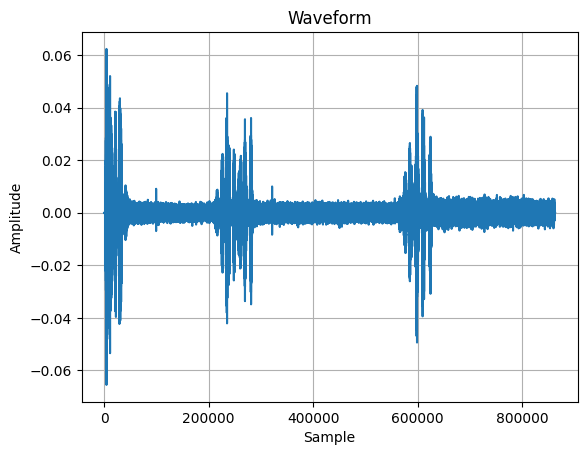

In [126]:
class RandomGainTransition(torch.nn.Module):
    def __init__(self, min_gain_db=-10, max_gain_db=10, duration=None):
        super(RandomGainTransition, self).__init__()
        self.min_gain_db = min_gain_db
        self.max_gain_db = max_gain_db
        self.duration = duration

    def forward(self, waveform):
        start_gain_db = random.uniform(self.min_gain_db, self.max_gain_db)
        end_gain_db = random.uniform(self.min_gain_db, self.max_gain_db)
        if self.duration is None:
            self.duration = waveform.shape[1]
        gains = torch.linspace(start_gain_db, end_gain_db, self.duration)
        waveform = waveform * torch.pow(10.0, gains / 20.0)
        return waveform


random_gain_transition = RandomGainTransition()
random_gain_transition_result = random_gain_transition(waveform)

plot_waveform(random_gain_transition_result, sample_rate)

In [66]:
Audio(random_gain_transition_result, rate=sample_rate)

### RandomGaussianNoise

- What it does:

This augmentation adds Gaussian (random) noise to the audio signal. The noise is controlled by the mean and standard deviation (std).

- Why it's useful:

Adding noise helps the model learn to recognize bird songs in noisy environments, improving its robustness to background noise in real-world recordings.

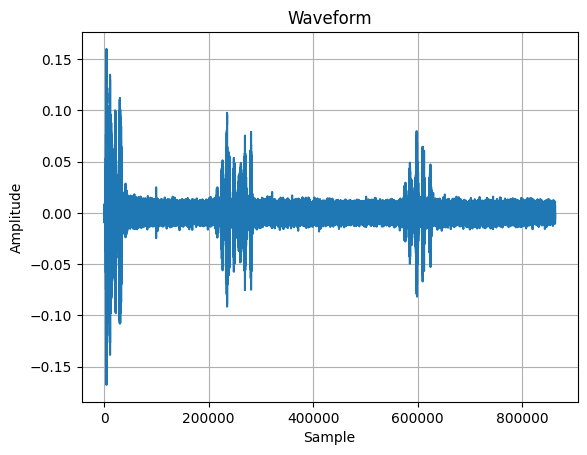

In [99]:
class RandomGaussianNoise(torch.nn.Module):
    def __init__(self, min_std=0.001, max_std=0.03):
        super(RandomGaussianNoise, self).__init__()
        self.min_std = min_std
        self.max_std = max_std

    def forward(self, waveform):
        std = random.uniform(self.min_std, self.max_std)
        noise = torch.randn_like(waveform) * std
        return waveform + noise


random_gaussian_noise = RandomGaussianNoise()
random_gaussian_noise_result = random_gaussian_noise(waveform)

plot_waveform(random_gaussian_noise_result, sample_rate)

In [96]:
Audio(random_gaussian_noise_result, rate=sample_rate)

### AddGaussianSNR

What it does:

- This augmentation adds Gaussian noise to the audio signal while maintaining a specified signal-to-noise ratio (SNR) in decibels (dB).

Why it's useful:

- Controlling the SNR ensures that the added noise is proportional to the signal's power, making it a more realistic simulation of noisy environments.



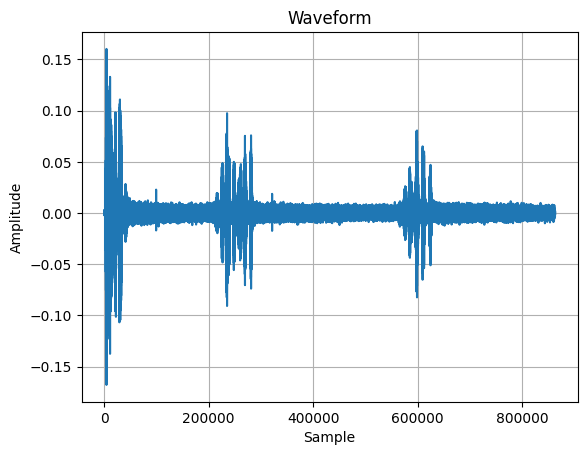

In [108]:
class RandomGaussianSNR(torch.nn.Module):
    def __init__(self, min_snr_db=10, max_snr_db=30):
        super(RandomGaussianSNR, self).__init__()
        self.min_snr_db = min_snr_db
        self.max_snr_db = max_snr_db

    def forward(self, waveform):
        snr_db = random.uniform(self.min_snr_db, self.max_snr_db)
        signal_power = waveform.pow(2).mean()
        noise_power = signal_power / (10 ** (snr_db / 10))
        noise = torch.randn_like(waveform) * torch.sqrt(noise_power)
        return waveform + noise


random_gaussian_snr = RandomGaussianSNR()
random_gaussian_snr_result = random_gaussian_snr(waveform)

plot_waveform(random_gaussian_snr_result, sample_rate)

In [109]:
Audio(random_gaussian_snr_result, rate=sample_rate)

### RandomLowPassFilter 

What it does:

- This augmentation applies a low-pass filter to the audio signal, attenuating frequencies above a specified cutoff frequency.

Why it's useful:

- Low-pass filtering can simulate the effect of recording equipment or environmental conditions that might attenuate higher frequencies. This helps the model learn to recognize bird songs even when high-frequency components are missing or reduced.

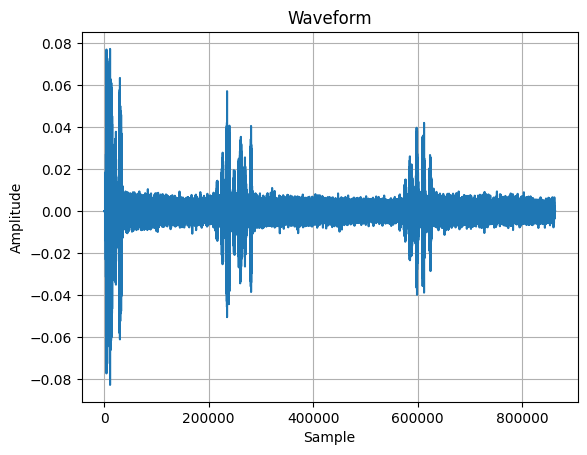

In [114]:
class RandomLowPassFilter(torch.nn.Module):
    def __init__(self, min_cutoff_freq=1000, max_cutoff_freq=5000, sample_rate=32000):
        super(RandomLowPassFilter, self).__init__()
        self.min_cutoff_freq = min_cutoff_freq
        self.max_cutoff_freq = max_cutoff_freq
        self.sample_rate = sample_rate

    def forward(self, waveform):
        cutoff_freq = random.uniform(self.min_cutoff_freq, self.max_cutoff_freq)
        return torchaudio.functional.lowpass_biquad(
            waveform, self.sample_rate, cutoff_freq
        )


random_low_pass_filter = RandomLowPassFilter()
random_low_pass_filter_result = random_low_pass_filter(waveform)

plot_waveform(random_low_pass_filter_result, sample_rate)

In [115]:
Audio(random_low_pass_filter_result, rate=sample_rate)